ViT-B16 (corrected): 21,302,066 / 85,837,106 parameters trainable (24.8%)


Epoch 1/5: 100%|██████████| 225/225 [1:27:37<00:00, 23.37s/it]


Epoch 1: Train Acc: 86.41%, Val Acc: 95.60%


Epoch 2/5: 100%|██████████| 225/225 [1:16:13<00:00, 20.33s/it]


Epoch 2: Train Acc: 95.14%, Val Acc: 94.00%


Epoch 3/5: 100%|██████████| 225/225 [52:02<00:00, 13.88s/it] 


Epoch 3: Train Acc: 95.84%, Val Acc: 94.80%


Epoch 4/5: 100%|██████████| 225/225 [38:33<00:00, 10.28s/it]


Epoch 4: Train Acc: 96.99%, Val Acc: 96.80%


Epoch 5/5: 100%|██████████| 225/225 [35:40<00:00,  9.51s/it]


Epoch 5: Train Acc: 97.16%, Val Acc: 95.20%


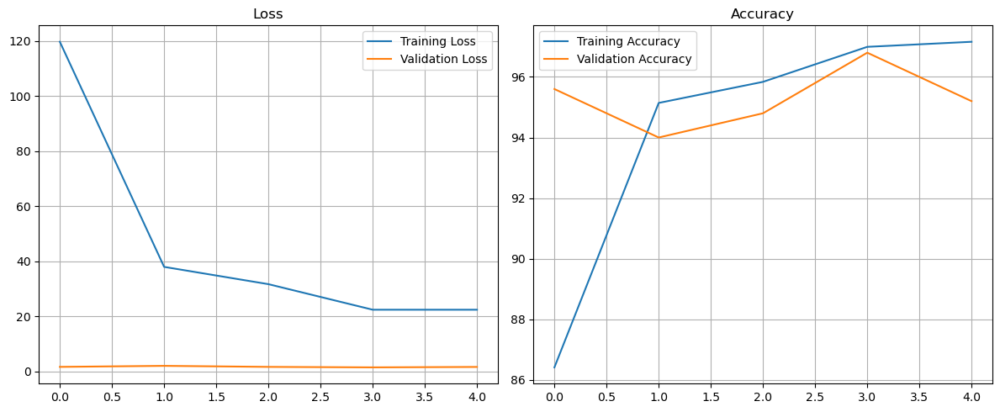

Test Accuracy: 97.20%
Classification Report:
                           precision    recall  f1-score   support

     ARCIGERA FLOWER MOTH       1.00      1.00      1.00         5
               ATLAS MOTH       1.00      1.00      1.00         5
        BANDED TIGER MOTH       0.83      1.00      0.91         5
  BIRD CHERRY ERMINE MOTH       1.00      1.00      1.00         5
        BLACK RUSTIC MOTH       1.00      1.00      1.00         5
             BLAIRS MOCHA       1.00      1.00      1.00         5
    BLOTCHED EMERALD MOTH       1.00      1.00      1.00         5
BLUE BORDERED CARPET MOTH       1.00      1.00      1.00         5
            CINNABAR MOTH       1.00      1.00      1.00         5
           CLEARWING MOTH       1.00      0.80      0.89         5
               COMET MOTH       1.00      1.00      1.00         5
    DEATHS HEAD HAWK MOTH       1.00      1.00      1.00         5
       ELEPHANT HAWK MOTH       1.00      1.00      1.00         5
         EMPEROR

In [81]:
# Import necessary programmes 
from pathlib import Path
import os

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm
from PIL import Image
import random

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

from torchvision import transforms, datasets, models
from torchvision.models import ViT_B_16_Weights

# Device - tells PyTorch code to automatically select GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Paths
data_root = Path("../data/kaggle-dataset/archive")

# Transforms - loads default pretrained weights for ViT-B_16 (trained on ImageNet)
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms()

# Dictionary-style dataset and dataloader setup
data_transforms = {
    'train': transform,
    'valid': transform,
    'test': transform
}

image_datasets = {
    split: datasets.ImageFolder(os.path.join(data_root, split), transform=data_transforms[split])
    for split in ['train', 'valid', 'test']
}

dataloaders = {
    split: DataLoader(image_datasets[split], batch_size=32, shuffle=(split == 'train'), num_workers=4)
    for split in ['train', 'valid', 'test']
}

class_names = image_datasets['train'].classes
num_classes = len(class_names)

# Load ViT-B_16 model with pretrained weights
model = models.vit_b_16(weights=weights)
model.heads.head = nn.Linear(model.heads.head.in_features, num_classes)

# Freeze all layers first
for param in model.parameters():
    param.requires_grad = False

# Unfreeze last 3 transformer blocks + heads 
for name, param in model.named_parameters():
    if any(layer in name for layer in ["encoder_layer_9", "encoder_layer_10", "encoder_layer_11"]) or "heads" in name:
        param.requires_grad = True

# Check parameters
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
total = sum(p.numel() for p in model.parameters())
print(f"ViT-B16 (corrected): {trainable:,} / {total:,} parameters trainable ({100*trainable/total:.1f}%)")

model.to(device)

# Loss and optimiser for calculating error and adjusting for model improvement
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, weight_decay=1e-4)

# Training
train_loss_list, val_loss_list = [], []
train_acc_list, val_acc_list = [], []
epochs = 5

for epoch in range(epochs):
    model.train()
    total_loss, total_correct, total_samples = 0, 0, 0

    for x, y in tqdm(dataloaders['train'], desc=f"Epoch {epoch+1}/{epochs}"):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        output = model(x)
        loss = criterion(output, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_correct += (output.argmax(1) == y).sum().item()
        total_samples += y.size(0)

    train_loss_list.append(total_loss)
    train_acc_list.append(100 * total_correct / total_samples)

    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for x, y in dataloaders['valid']:
            x, y = x.to(device), y.to(device)
            output = model(x)
            loss = criterion(output, y)
            val_loss += loss.item()
            val_correct += (output.argmax(1) == y).sum().item()
            val_total += y.size(0)

    val_loss_list.append(val_loss)
    val_acc_list.append(100 * val_correct / val_total)

    print(f"Epoch {epoch+1}: Train Acc: {train_acc_list[-1]:.2f}%, Val Acc: {val_acc_list[-1]:.2f}%")

# Plot
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss_list, label="Training Loss")
plt.plot(val_loss_list, label="Validation Loss")
plt.legend()
plt.title("Loss")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(train_acc_list, label="Training Accuracy")
plt.plot(val_acc_list, label="Validation Accuracy")
plt.legend()
plt.title("Accuracy")
plt.grid(True)

plt.tight_layout()
plt.show()

# Test evaluation
model.eval()
all_preds, all_labels = [], []
test_correct, test_total = 0, 0

with torch.no_grad():
    for x, y in dataloaders['test']:
        x, y = x.to(device), y.to(device)
        output = model(x)
        pred = output.argmax(1)
        all_preds.extend(pred.cpu().numpy())
        all_labels.extend(y.cpu().numpy())
        test_correct += (pred == y).sum().item()
        test_total += y.size(0)

print(f"Test Accuracy: {100 * test_correct / test_total:.2f}%")
print("Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confused pairs
cm = confusion_matrix(all_labels, all_preds)
cm_copy = cm.copy()
np.fill_diagonal(cm_copy, 0)
confused = np.argwhere(cm_copy > 0)

print("Confused Class Pairs:")
for i, (true, pred) in enumerate(confused):
    count = cm[true, pred]
    print(f"{i+1}. True: {class_names[true]} ↔ Pred: {class_names[pred]} ({count} times)")


In [84]:
torch.save(model.state_dict(), "vit_b16_partial_ft.pth")

In [83]:
# Visualise confused species pairs
def show_confused_species(dataset_dir, confused_pairs, n_samples=3):
    """
    This function will display sample images of species the model confused with one another side-by-side.
    """
    test_dir = Path(dataset_dir) / "test"

    for true_class, pred_class in confused_pairs:
        true_imgs = list((test_dir / true_class).glob("*"))
        pred_imgs = list((test_dir / pred_class).glob("*"))

        true_samples = random.sample(true_imgs, min(n_samples, len(true_imgs)))
        pred_samples = random.sample(pred_imgs, min(n_samples, len(pred_imgs)))

        print(f"\nConfused: '{true_class}' predicted as '{pred_class}'")

        fig, axes = plt.subplots(2, n_samples, figsize=(n_samples * 3, 5))

        for i in range(n_samples):
            # Actual species images
            if i < len(true_samples):
                axes[0, i].imshow(Image.open(true_samples[i]))
                axes[0, i].set_title(true_class, fontsize=9)
            axes[0, i].axis('off')

            # Predicted species images
            if i < len(pred_samples):
                axes[1, i].imshow(Image.open(pred_samples[i]))
                axes[1, i].set_title(pred_class, fontsize=9)
            axes[1, i].axis('off')

        plt.suptitle(f"'{true_class}' ↔ '{pred_class}'", fontsize=12)
        plt.tight_layout()
        plt.show()



Confused: 'CLEARWING MOTH' predicted as 'HORNET MOTH'


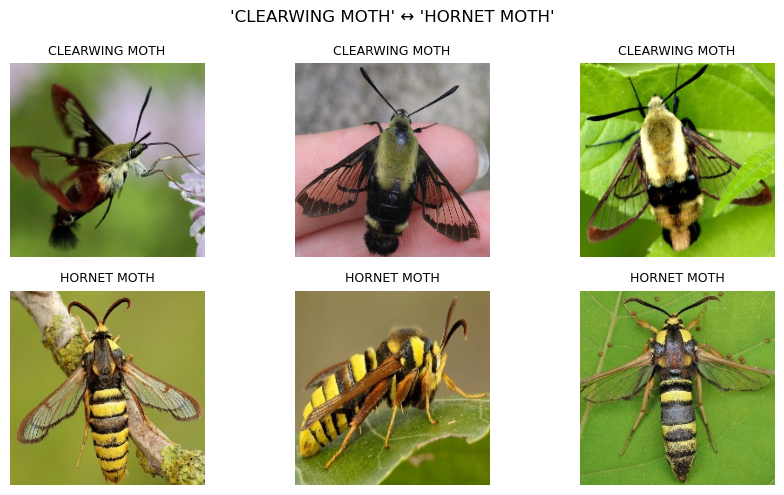


Confused: 'GARDEN TIGER MOTH' predicted as 'BANDED TIGER MOTH'


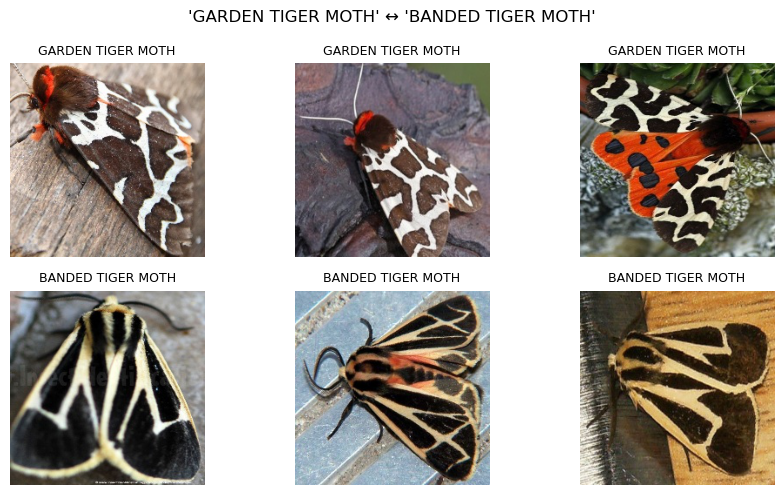


Confused: 'KENTISH GLORY MOTH' predicted as 'WHITE LINED SPHINX MOTH'


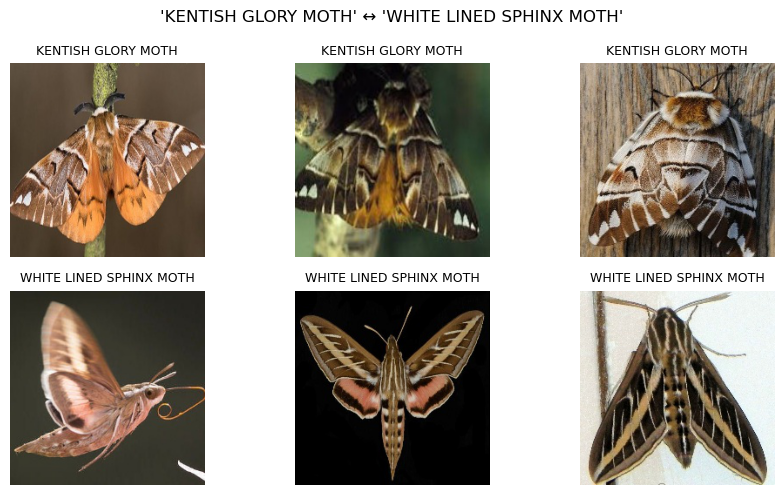


Confused: 'POLYPHEMUS MOTH' predicted as 'OWL MOTH'


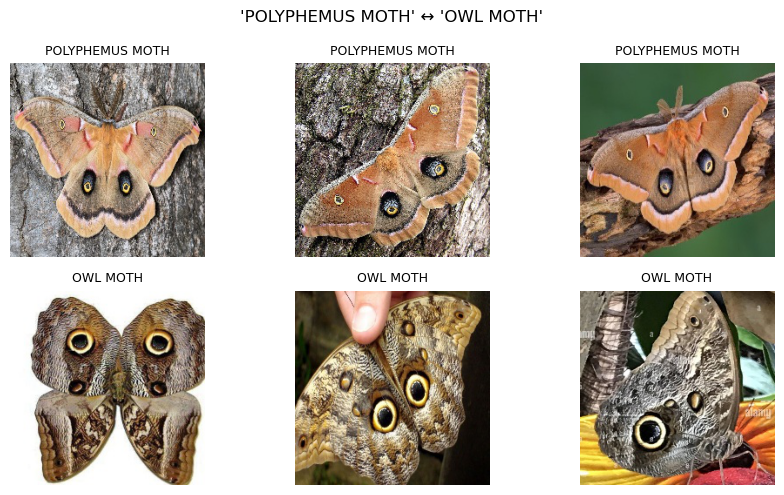

In [85]:
from pathlib import Path
import os
import random

from PIL import Image
import matplotlib.pyplot as plt

# Define confused class pairs based on the confusion matrix output
confused_pairs_to_plot = [
    ("CLEARWING MOTH", "HORNET MOTH"),
    ("GARDEN TIGER MOTH", "BANDED TIGER MOTH"),
    ("KENTISH GLORY MOTH", "WHITE LINED SPHINX MOTH"),
    ("POLYPHEMUS MOTH", "OWL MOTH")
]


# Call the visualisation function
show_confused_species("../data/kaggle-dataset/archive", confused_pairs_to_plot)

In [90]:
from torchvision.models import vit_b_16, ViT_B_16_Weights  
from pytorch_grad_cam import GradCAMPlusPlus  
from pytorch_grad_cam.utils.image import show_cam_on_image
from pathlib import Path
import torch
import torch.nn as nn
import numpy as np
import torchvision.transforms as transforms
from PIL import Image
import cv2

# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  # remove CLS token
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/CLEARWING MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Grad-CAM++ 
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/gradcampp-clearwing-1.jpg")
cv2.imwrite(str(output_path), visualisation)


True

In [86]:
from torchvision.models import vit_b_16, ViT_B_16_Weights  
from pytorch_grad_cam import ScoreCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pathlib import Path
import torch
import torch.nn as nn
import numpy as np
import torchvision.transforms as transforms
from PIL import Image
import cv2

# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/CLEARWING MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Score-CAM
cam = ScoreCAM(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/score-cam-clearwing-1.jpg")
cv2.imwrite(str(output_path), visualisation)

c:\Users\rebec\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\rebec\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
100%|██████████| 48/48 [02:38<00:00,  3.30s/it]


True

In [91]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  # remove CLS token
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/HORNET MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Grad-CAM++ 
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/gradcampp-hornet-1.jpg")
cv2.imwrite(str(output_path), visualisation)


True

In [92]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/HORNET MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Score-CAM
cam = ScoreCAM(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/score-cam-hornet-1.jpg")
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 48/48 [02:09<00:00,  2.69s/it]


True

In [93]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  # remove CLS token
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/GARDEN TIGER MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Grad-CAM++ 
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/gradcampp-garden-tiger-1.jpg")
cv2.imwrite(str(output_path), visualisation)


True

In [94]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/GARDEN TIGER MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Score-CAM
cam = ScoreCAM(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/score-cam-garden-tiger-1.jpg")
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 48/48 [00:56<00:00,  1.18s/it]


True

In [95]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  # remove CLS token
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/BANDED TIGER MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Grad-CAM++ 
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/gradcampp-banded-tiger-1.jpg")
cv2.imwrite(str(output_path), visualisation)


True

In [96]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/BANDED TIGER MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Score-CAM
cam = ScoreCAM(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/score-cam-banded-tiger-1.jpg")
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 48/48 [01:12<00:00,  1.51s/it]


True

In [97]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  # remove CLS token
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/KENTISH GLORY MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Grad-CAM++ 
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/gradcampp-kentish-glory-1.jpg")
cv2.imwrite(str(output_path), visualisation)


True

In [98]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/KENTISH GLORY MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Score-CAM
cam = ScoreCAM(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/score-cam-kentish-glory-1.jpg")
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 48/48 [02:59<00:00,  3.74s/it]


True

In [99]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  # remove CLS token
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/WHITE LINED SPHINX MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Grad-CAM++ 
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/gradcampp-white-lined-sphinx-1.jpg")
cv2.imwrite(str(output_path), visualisation)


True

In [100]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/WHITE LINED SPHINX MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Score-CAM
cam = ScoreCAM(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/score-cam-white-lined-sphinx-1.jpg")
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 48/48 [01:58<00:00,  2.47s/it]


True

In [101]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  # remove CLS token
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/POLYPHEMUS MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Grad-CAM++ 
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/gradcampp-polyphemus-1.jpg")
cv2.imwrite(str(output_path), visualisation)


True

In [102]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/POLYPHEMUS MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Score-CAM
cam = ScoreCAM(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/score-cam-polyphemus-1.jpg")
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 48/48 [01:58<00:00,  2.47s/it]


True

In [103]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  # remove CLS token
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/OWL MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Grad-CAM++ 
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/gradcampp-owl-1.jpg")
cv2.imwrite(str(output_path), visualisation)


True

In [104]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/OWL MOTH/1.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Score-CAM
cam = ScoreCAM(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/score-cam-owl-1.jpg")
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 48/48 [02:19<00:00,  2.91s/it]


True

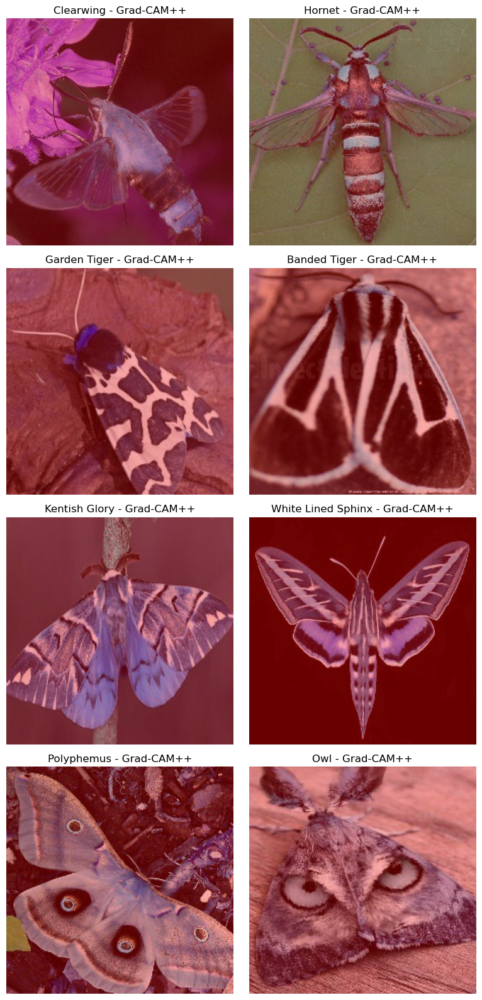

In [107]:
import matplotlib.image as mpimg

# Define Grad-CAM image paths for confused pairs
species_pairs = [
    ("clearwing", "hornet"),
    ("garden-tiger", "banded-tiger"),
    ("kentish-glory", "white-lined-sphinx"),
    ("polyphemus", "owl"),
]

base_path = Path("../cam_outputs/vit_b16")
fig, axs = plt.subplots(len(species_pairs), 2, figsize=(8, len(species_pairs) * 4))

for i, (sp1, sp2) in enumerate(species_pairs):
    img1 = mpimg.imread(base_path / f"gradcampp-{sp1}-1.jpg")
    img2 = mpimg.imread(base_path / f"gradcampp-{sp2}-1.jpg")

    axs[i, 0].imshow(img1)
    axs[i, 0].axis('off')
    axs[i, 0].set_title(f"{sp1.replace('-', ' ').title()} - Grad-CAM++")

    axs[i, 1].imshow(img2)
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f"{sp2.replace('-', ' ').title()} - Grad-CAM++")

plt.tight_layout()
plt.show()


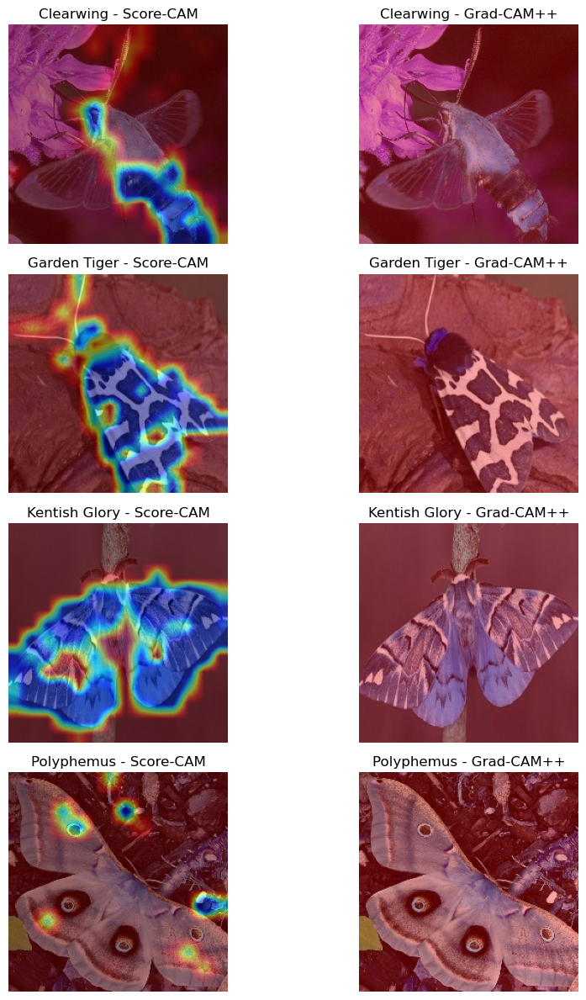

In [ ]:
import matplotlib.pyplot as plt
import cv2
from pathlib import Path

# Define the folder where ViT CAM outputs are saved 
cam_folder = Path("../cam_outputs/vit_b16")

# Define species pairs (true, predicted)
species_pairs = [
    ("clearwing", "hornet"),
    ("garden-tiger", "banded-tiger"),
    ("kentish-glory", "white-lined-sphinx"),
    ("polyphemus", "owl"),
]

# Plot settings
fig, axs = plt.subplots(len(species_pairs), 2, figsize=(10, len(species_pairs) * 3))

for i, (true_sp, pred_sp) in enumerate(species_pairs):
    # Use species for file lookup
    score_path = cam_folder / f"score-cam-{true_sp}-1.jpg"
    grad_path = cam_folder / f"gradcampp-{true_sp}-1.jpg"

    # Load images
    score_img_bgr = cv2.imread(str(score_path))
    grad_img_bgr = cv2.imread(str(grad_path))

    if score_img_bgr is None or grad_img_bgr is None:
        axs[i, 0].axis("off")
        axs[i, 1].axis("off")
        axs[i, 0].set_title(f"{true_sp} - Score-CAM")
        axs[i, 1].set_title(f"{true_sp} - Grad-CAM++")
        continue

    score_img = cv2.cvtColor(score_img_bgr, cv2.COLOR_BGR2RGB)
    grad_img = cv2.cvtColor(grad_img_bgr, cv2.COLOR_BGR2RGB)

    # Plot Score-CAM
    axs[i, 0].imshow(score_img)
    axs[i, 0].axis("off")
    axs[i, 0].set_title(f"{true_sp.replace('-', ' ').title()} - Score-CAM")

    # Plot Grad-CAM++
    axs[i, 1].imshow(grad_img)
    axs[i, 1].axis("off")
    axs[i, 1].set_title(f"{true_sp.replace('-', ' ').title()} - Grad-CAM++")

plt.tight_layout()
plt.show()


We will now continue with Score-CAM to evaluate model attention using top confused pairs

In [113]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/OWL MOTH/5.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Score-CAM
cam = ScoreCAM(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/score-cam-owl-5.jpg")
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 48/48 [02:52<00:00,  3.58s/it]


True

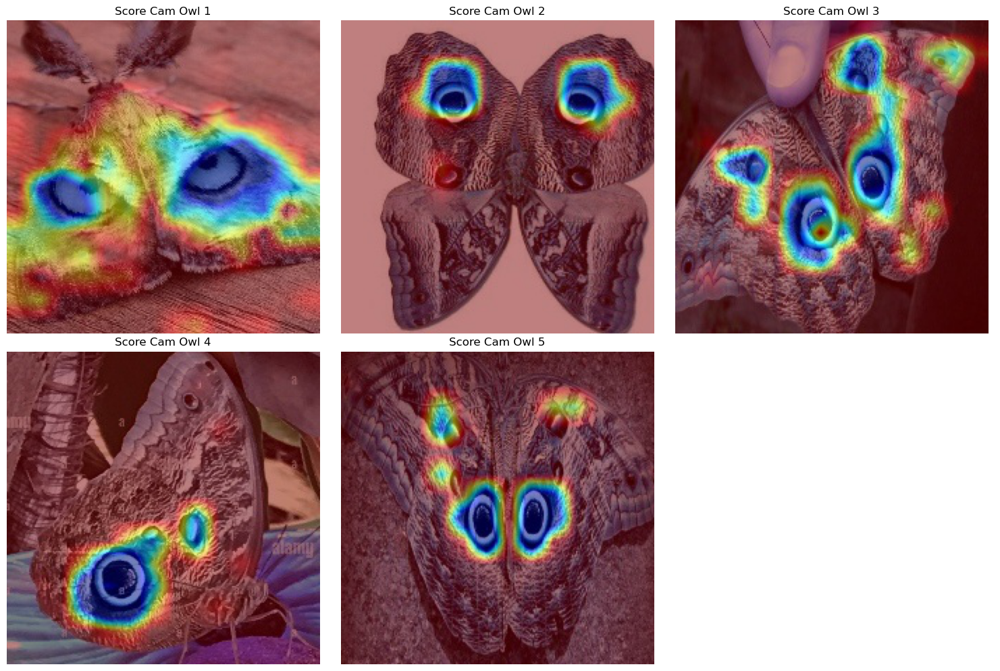

In [114]:
# Directory containing the images
base_path = Path("../cam_outputs/vit_b16") 

# Gather all Score-CAM images for Humming Bird Hawk Moth
image_paths = sorted(base_path.glob("score-cam-owl-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()


In [118]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/POLYPHEMUS MOTH/5.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Score-CAM
cam = ScoreCAM(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/score-cam-polyphemus-5.jpg")
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 48/48 [04:40<00:00,  5.85s/it]


True

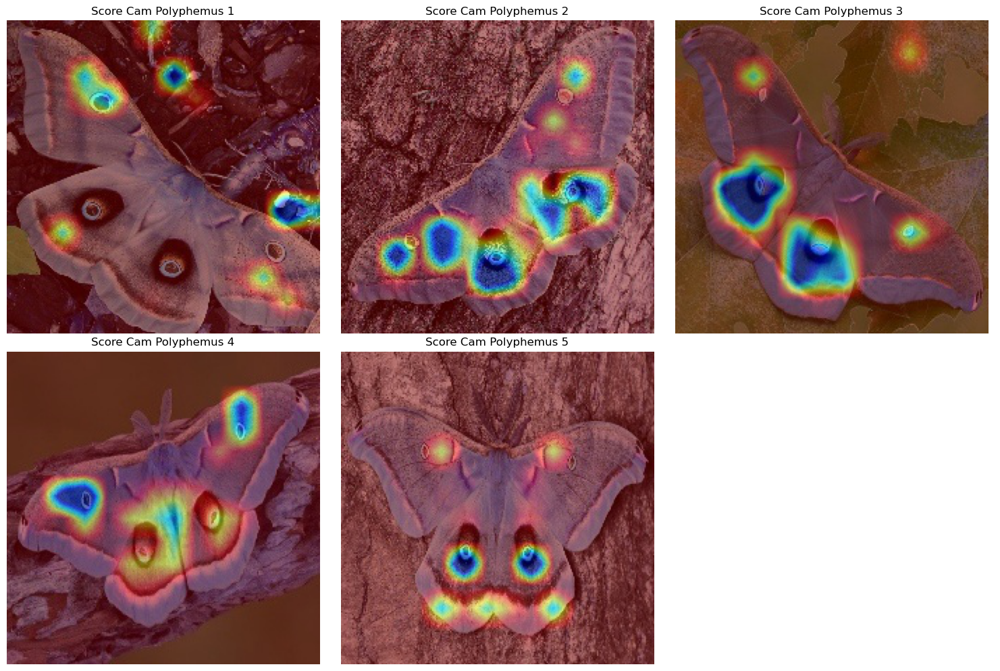

In [119]:
# Directory containing the images
base_path = Path("../cam_outputs/vit_b16") 

# Gather all Score-CAM images for Humming Bird Hawk Moth
image_paths = sorted(base_path.glob("score-cam-polyphemus-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()


In [123]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/GARDEN TIGER MOTH/5.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Score-CAM
cam = ScoreCAM(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/score-cam-garden-tiger-5.jpg")
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 48/48 [03:08<00:00,  3.92s/it]


True

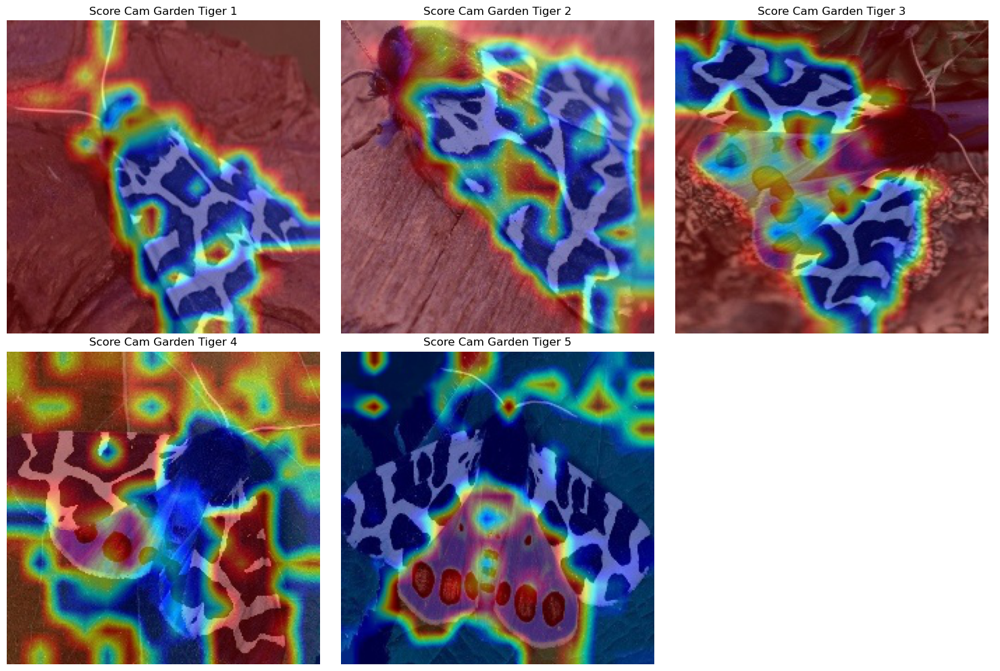

In [124]:
# Directory containing the images
base_path = Path("../cam_outputs/vit_b16") 

# Gather all Score-CAM images for Humming Bird Hawk Moth
image_paths = sorted(base_path.glob("score-cam-garden-tiger-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()


In [129]:
# Define reshape_transform for ViT
def vit_reshape_transform(tensor):
    result = tensor[:, 1:, :]  
    result = result.reshape(result.size(0), 14, 14, -1)
    result = result.permute(0, 3, 1, 2)  
    return result

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = vit_b_16(pretrained=False)
model.heads.head = nn.Linear(model.heads.head.in_features, 50)  

model.load_state_dict(torch.load("vit_b16_partial_ft.pth", map_location=device))
model.to(device)
model.eval()

# Load and preprocess image
image_path = "../data/kaggle-dataset/archive/test/BANDED TIGER MOTH/5.jpg"
rgb_img = np.array(Image.open(image_path).convert("RGB")) / 255.0

# Use the same transform as training
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms() 

# Apply transform to PIL image 
input_tensor = transform(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

# Target Layer 
target_layer = model.encoder.ln

# Score-CAM
cam = ScoreCAM(model=model, target_layers=[target_layer], reshape_transform=vit_reshape_transform)

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0]
grayscale_cam = np.clip(grayscale_cam * 1.5, 0, 1)  
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)

output_path = Path("../cam_outputs/vit_b16/score-cam-banded-tiger-5.jpg")
cv2.imwrite(str(output_path), visualisation)

100%|██████████| 48/48 [04:27<00:00,  5.57s/it]


True

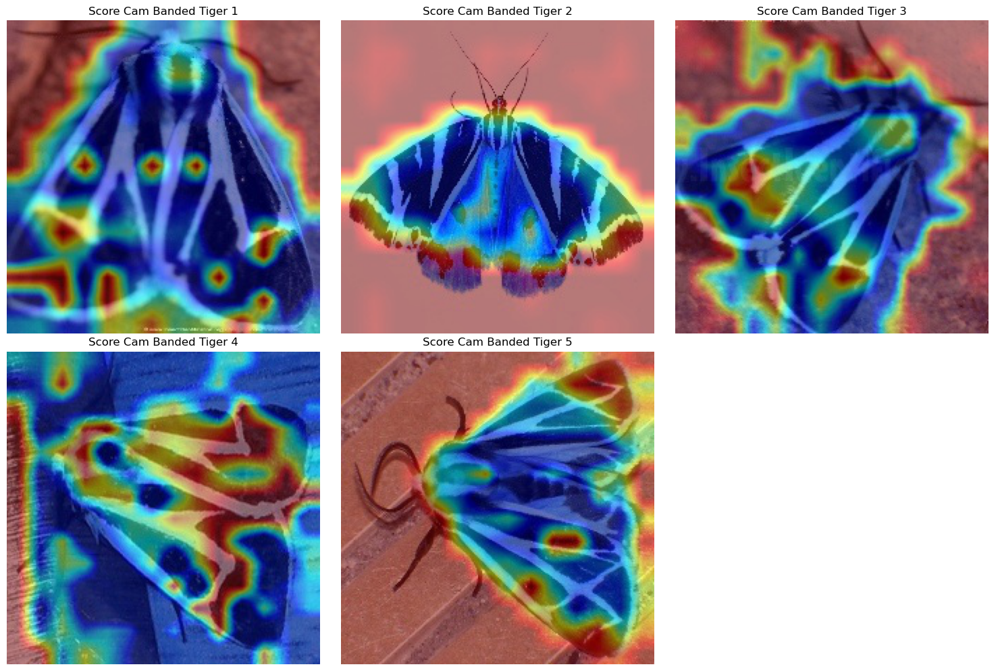

In [130]:
# Directory containing the images
base_path = Path("../cam_outputs/vit_b16") 

# Gather all Score-CAM images for Humming Bird Hawk Moth
image_paths = sorted(base_path.glob("score-cam-banded-tiger-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()
